In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks from prompts with SAM

The Segment Anything Model (SAM) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt. 

The `SamPredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

In [1]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [2]:
using_colab = False

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
    
    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg
        
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [4]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [5]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    


## Example image

In [6]:
# image = cv2.imread('images/truck.jpg')
image = cv2.imread("/home/wlli/Data/deepyeast_datasets/test_examples/C1-20230915_30c24h_JCS0424_03_snapshot_R3D.crop.tif")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

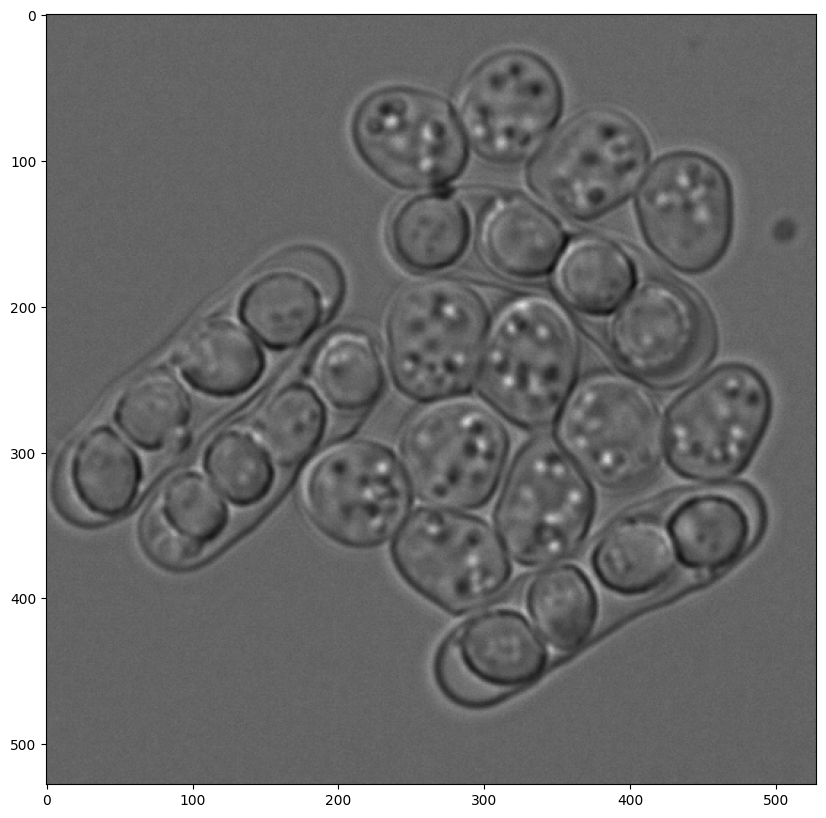

In [7]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

## Selecting objects with SAM

First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [209]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "../models/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

my_mito_model.load_state_dict(torch.load("/home/wlli/Data/mito_model_checkpoint.pth"))
sam.to(device=device)

predictor = SamPredictor(sam)

RuntimeError: Error(s) in loading state_dict for Sam:
	Missing key(s) in state_dict: "image_encoder.pos_embed", "image_encoder.patch_embed.proj.weight", "image_encoder.patch_embed.proj.bias", "image_encoder.blocks.0.norm1.weight", "image_encoder.blocks.0.norm1.bias", "image_encoder.blocks.0.attn.rel_pos_h", "image_encoder.blocks.0.attn.rel_pos_w", "image_encoder.blocks.0.attn.qkv.weight", "image_encoder.blocks.0.attn.qkv.bias", "image_encoder.blocks.0.attn.proj.weight", "image_encoder.blocks.0.attn.proj.bias", "image_encoder.blocks.0.norm2.weight", "image_encoder.blocks.0.norm2.bias", "image_encoder.blocks.0.mlp.lin1.weight", "image_encoder.blocks.0.mlp.lin1.bias", "image_encoder.blocks.0.mlp.lin2.weight", "image_encoder.blocks.0.mlp.lin2.bias", "image_encoder.blocks.1.norm1.weight", "image_encoder.blocks.1.norm1.bias", "image_encoder.blocks.1.attn.rel_pos_h", "image_encoder.blocks.1.attn.rel_pos_w", "image_encoder.blocks.1.attn.qkv.weight", "image_encoder.blocks.1.attn.qkv.bias", "image_encoder.blocks.1.attn.proj.weight", "image_encoder.blocks.1.attn.proj.bias", "image_encoder.blocks.1.norm2.weight", "image_encoder.blocks.1.norm2.bias", "image_encoder.blocks.1.mlp.lin1.weight", "image_encoder.blocks.1.mlp.lin1.bias", "image_encoder.blocks.1.mlp.lin2.weight", "image_encoder.blocks.1.mlp.lin2.bias", "image_encoder.blocks.2.norm1.weight", "image_encoder.blocks.2.norm1.bias", "image_encoder.blocks.2.attn.rel_pos_h", "image_encoder.blocks.2.attn.rel_pos_w", "image_encoder.blocks.2.attn.qkv.weight", "image_encoder.blocks.2.attn.qkv.bias", "image_encoder.blocks.2.attn.proj.weight", "image_encoder.blocks.2.attn.proj.bias", "image_encoder.blocks.2.norm2.weight", "image_encoder.blocks.2.norm2.bias", "image_encoder.blocks.2.mlp.lin1.weight", "image_encoder.blocks.2.mlp.lin1.bias", "image_encoder.blocks.2.mlp.lin2.weight", "image_encoder.blocks.2.mlp.lin2.bias", "image_encoder.blocks.3.norm1.weight", "image_encoder.blocks.3.norm1.bias", "image_encoder.blocks.3.attn.rel_pos_h", "image_encoder.blocks.3.attn.rel_pos_w", "image_encoder.blocks.3.attn.qkv.weight", "image_encoder.blocks.3.attn.qkv.bias", "image_encoder.blocks.3.attn.proj.weight", "image_encoder.blocks.3.attn.proj.bias", "image_encoder.blocks.3.norm2.weight", "image_encoder.blocks.3.norm2.bias", "image_encoder.blocks.3.mlp.lin1.weight", "image_encoder.blocks.3.mlp.lin1.bias", "image_encoder.blocks.3.mlp.lin2.weight", "image_encoder.blocks.3.mlp.lin2.bias", "image_encoder.blocks.4.norm1.weight", "image_encoder.blocks.4.norm1.bias", "image_encoder.blocks.4.attn.rel_pos_h", "image_encoder.blocks.4.attn.rel_pos_w", "image_encoder.blocks.4.attn.qkv.weight", "image_encoder.blocks.4.attn.qkv.bias", "image_encoder.blocks.4.attn.proj.weight", "image_encoder.blocks.4.attn.proj.bias", "image_encoder.blocks.4.norm2.weight", "image_encoder.blocks.4.norm2.bias", "image_encoder.blocks.4.mlp.lin1.weight", "image_encoder.blocks.4.mlp.lin1.bias", "image_encoder.blocks.4.mlp.lin2.weight", "image_encoder.blocks.4.mlp.lin2.bias", "image_encoder.blocks.5.norm1.weight", "image_encoder.blocks.5.norm1.bias", "image_encoder.blocks.5.attn.rel_pos_h", "image_encoder.blocks.5.attn.rel_pos_w", "image_encoder.blocks.5.attn.qkv.weight", "image_encoder.blocks.5.attn.qkv.bias", "image_encoder.blocks.5.attn.proj.weight", "image_encoder.blocks.5.attn.proj.bias", "image_encoder.blocks.5.norm2.weight", "image_encoder.blocks.5.norm2.bias", "image_encoder.blocks.5.mlp.lin1.weight", "image_encoder.blocks.5.mlp.lin1.bias", "image_encoder.blocks.5.mlp.lin2.weight", "image_encoder.blocks.5.mlp.lin2.bias", "image_encoder.blocks.6.norm1.weight", "image_encoder.blocks.6.norm1.bias", "image_encoder.blocks.6.attn.rel_pos_h", "image_encoder.blocks.6.attn.rel_pos_w", "image_encoder.blocks.6.attn.qkv.weight", "image_encoder.blocks.6.attn.qkv.bias", "image_encoder.blocks.6.attn.proj.weight", "image_encoder.blocks.6.attn.proj.bias", "image_encoder.blocks.6.norm2.weight", "image_encoder.blocks.6.norm2.bias", "image_encoder.blocks.6.mlp.lin1.weight", "image_encoder.blocks.6.mlp.lin1.bias", "image_encoder.blocks.6.mlp.lin2.weight", "image_encoder.blocks.6.mlp.lin2.bias", "image_encoder.blocks.7.norm1.weight", "image_encoder.blocks.7.norm1.bias", "image_encoder.blocks.7.attn.rel_pos_h", "image_encoder.blocks.7.attn.rel_pos_w", "image_encoder.blocks.7.attn.qkv.weight", "image_encoder.blocks.7.attn.qkv.bias", "image_encoder.blocks.7.attn.proj.weight", "image_encoder.blocks.7.attn.proj.bias", "image_encoder.blocks.7.norm2.weight", "image_encoder.blocks.7.norm2.bias", "image_encoder.blocks.7.mlp.lin1.weight", "image_encoder.blocks.7.mlp.lin1.bias", "image_encoder.blocks.7.mlp.lin2.weight", "image_encoder.blocks.7.mlp.lin2.bias", "image_encoder.blocks.8.norm1.weight", "image_encoder.blocks.8.norm1.bias", "image_encoder.blocks.8.attn.rel_pos_h", "image_encoder.blocks.8.attn.rel_pos_w", "image_encoder.blocks.8.attn.qkv.weight", "image_encoder.blocks.8.attn.qkv.bias", "image_encoder.blocks.8.attn.proj.weight", "image_encoder.blocks.8.attn.proj.bias", "image_encoder.blocks.8.norm2.weight", "image_encoder.blocks.8.norm2.bias", "image_encoder.blocks.8.mlp.lin1.weight", "image_encoder.blocks.8.mlp.lin1.bias", "image_encoder.blocks.8.mlp.lin2.weight", "image_encoder.blocks.8.mlp.lin2.bias", "image_encoder.blocks.9.norm1.weight", "image_encoder.blocks.9.norm1.bias", "image_encoder.blocks.9.attn.rel_pos_h", "image_encoder.blocks.9.attn.rel_pos_w", "image_encoder.blocks.9.attn.qkv.weight", "image_encoder.blocks.9.attn.qkv.bias", "image_encoder.blocks.9.attn.proj.weight", "image_encoder.blocks.9.attn.proj.bias", "image_encoder.blocks.9.norm2.weight", "image_encoder.blocks.9.norm2.bias", "image_encoder.blocks.9.mlp.lin1.weight", "image_encoder.blocks.9.mlp.lin1.bias", "image_encoder.blocks.9.mlp.lin2.weight", "image_encoder.blocks.9.mlp.lin2.bias", "image_encoder.blocks.10.norm1.weight", "image_encoder.blocks.10.norm1.bias", "image_encoder.blocks.10.attn.rel_pos_h", "image_encoder.blocks.10.attn.rel_pos_w", "image_encoder.blocks.10.attn.qkv.weight", "image_encoder.blocks.10.attn.qkv.bias", "image_encoder.blocks.10.attn.proj.weight", "image_encoder.blocks.10.attn.proj.bias", "image_encoder.blocks.10.norm2.weight", "image_encoder.blocks.10.norm2.bias", "image_encoder.blocks.10.mlp.lin1.weight", "image_encoder.blocks.10.mlp.lin1.bias", "image_encoder.blocks.10.mlp.lin2.weight", "image_encoder.blocks.10.mlp.lin2.bias", "image_encoder.blocks.11.norm1.weight", "image_encoder.blocks.11.norm1.bias", "image_encoder.blocks.11.attn.rel_pos_h", "image_encoder.blocks.11.attn.rel_pos_w", "image_encoder.blocks.11.attn.qkv.weight", "image_encoder.blocks.11.attn.qkv.bias", "image_encoder.blocks.11.attn.proj.weight", "image_encoder.blocks.11.attn.proj.bias", "image_encoder.blocks.11.norm2.weight", "image_encoder.blocks.11.norm2.bias", "image_encoder.blocks.11.mlp.lin1.weight", "image_encoder.blocks.11.mlp.lin1.bias", "image_encoder.blocks.11.mlp.lin2.weight", "image_encoder.blocks.11.mlp.lin2.bias", "image_encoder.blocks.12.norm1.weight", "image_encoder.blocks.12.norm1.bias", "image_encoder.blocks.12.attn.rel_pos_h", "image_encoder.blocks.12.attn.rel_pos_w", "image_encoder.blocks.12.attn.qkv.weight", "image_encoder.blocks.12.attn.qkv.bias", "image_encoder.blocks.12.attn.proj.weight", "image_encoder.blocks.12.attn.proj.bias", "image_encoder.blocks.12.norm2.weight", "image_encoder.blocks.12.norm2.bias", "image_encoder.blocks.12.mlp.lin1.weight", "image_encoder.blocks.12.mlp.lin1.bias", "image_encoder.blocks.12.mlp.lin2.weight", "image_encoder.blocks.12.mlp.lin2.bias", "image_encoder.blocks.13.norm1.weight", "image_encoder.blocks.13.norm1.bias", "image_encoder.blocks.13.attn.rel_pos_h", "image_encoder.blocks.13.attn.rel_pos_w", "image_encoder.blocks.13.attn.qkv.weight", "image_encoder.blocks.13.attn.qkv.bias", "image_encoder.blocks.13.attn.proj.weight", "image_encoder.blocks.13.attn.proj.bias", "image_encoder.blocks.13.norm2.weight", "image_encoder.blocks.13.norm2.bias", "image_encoder.blocks.13.mlp.lin1.weight", "image_encoder.blocks.13.mlp.lin1.bias", "image_encoder.blocks.13.mlp.lin2.weight", "image_encoder.blocks.13.mlp.lin2.bias", "image_encoder.blocks.14.norm1.weight", "image_encoder.blocks.14.norm1.bias", "image_encoder.blocks.14.attn.rel_pos_h", "image_encoder.blocks.14.attn.rel_pos_w", "image_encoder.blocks.14.attn.qkv.weight", "image_encoder.blocks.14.attn.qkv.bias", "image_encoder.blocks.14.attn.proj.weight", "image_encoder.blocks.14.attn.proj.bias", "image_encoder.blocks.14.norm2.weight", "image_encoder.blocks.14.norm2.bias", "image_encoder.blocks.14.mlp.lin1.weight", "image_encoder.blocks.14.mlp.lin1.bias", "image_encoder.blocks.14.mlp.lin2.weight", "image_encoder.blocks.14.mlp.lin2.bias", "image_encoder.blocks.15.norm1.weight", "image_encoder.blocks.15.norm1.bias", "image_encoder.blocks.15.attn.rel_pos_h", "image_encoder.blocks.15.attn.rel_pos_w", "image_encoder.blocks.15.attn.qkv.weight", "image_encoder.blocks.15.attn.qkv.bias", "image_encoder.blocks.15.attn.proj.weight", "image_encoder.blocks.15.attn.proj.bias", "image_encoder.blocks.15.norm2.weight", "image_encoder.blocks.15.norm2.bias", "image_encoder.blocks.15.mlp.lin1.weight", "image_encoder.blocks.15.mlp.lin1.bias", "image_encoder.blocks.15.mlp.lin2.weight", "image_encoder.blocks.15.mlp.lin2.bias", "image_encoder.blocks.16.norm1.weight", "image_encoder.blocks.16.norm1.bias", "image_encoder.blocks.16.attn.rel_pos_h", "image_encoder.blocks.16.attn.rel_pos_w", "image_encoder.blocks.16.attn.qkv.weight", "image_encoder.blocks.16.attn.qkv.bias", "image_encoder.blocks.16.attn.proj.weight", "image_encoder.blocks.16.attn.proj.bias", "image_encoder.blocks.16.norm2.weight", "image_encoder.blocks.16.norm2.bias", "image_encoder.blocks.16.mlp.lin1.weight", "image_encoder.blocks.16.mlp.lin1.bias", "image_encoder.blocks.16.mlp.lin2.weight", "image_encoder.blocks.16.mlp.lin2.bias", "image_encoder.blocks.17.norm1.weight", "image_encoder.blocks.17.norm1.bias", "image_encoder.blocks.17.attn.rel_pos_h", "image_encoder.blocks.17.attn.rel_pos_w", "image_encoder.blocks.17.attn.qkv.weight", "image_encoder.blocks.17.attn.qkv.bias", "image_encoder.blocks.17.attn.proj.weight", "image_encoder.blocks.17.attn.proj.bias", "image_encoder.blocks.17.norm2.weight", "image_encoder.blocks.17.norm2.bias", "image_encoder.blocks.17.mlp.lin1.weight", "image_encoder.blocks.17.mlp.lin1.bias", "image_encoder.blocks.17.mlp.lin2.weight", "image_encoder.blocks.17.mlp.lin2.bias", "image_encoder.blocks.18.norm1.weight", "image_encoder.blocks.18.norm1.bias", "image_encoder.blocks.18.attn.rel_pos_h", "image_encoder.blocks.18.attn.rel_pos_w", "image_encoder.blocks.18.attn.qkv.weight", "image_encoder.blocks.18.attn.qkv.bias", "image_encoder.blocks.18.attn.proj.weight", "image_encoder.blocks.18.attn.proj.bias", "image_encoder.blocks.18.norm2.weight", "image_encoder.blocks.18.norm2.bias", "image_encoder.blocks.18.mlp.lin1.weight", "image_encoder.blocks.18.mlp.lin1.bias", "image_encoder.blocks.18.mlp.lin2.weight", "image_encoder.blocks.18.mlp.lin2.bias", "image_encoder.blocks.19.norm1.weight", "image_encoder.blocks.19.norm1.bias", "image_encoder.blocks.19.attn.rel_pos_h", "image_encoder.blocks.19.attn.rel_pos_w", "image_encoder.blocks.19.attn.qkv.weight", "image_encoder.blocks.19.attn.qkv.bias", "image_encoder.blocks.19.attn.proj.weight", "image_encoder.blocks.19.attn.proj.bias", "image_encoder.blocks.19.norm2.weight", "image_encoder.blocks.19.norm2.bias", "image_encoder.blocks.19.mlp.lin1.weight", "image_encoder.blocks.19.mlp.lin1.bias", "image_encoder.blocks.19.mlp.lin2.weight", "image_encoder.blocks.19.mlp.lin2.bias", "image_encoder.blocks.20.norm1.weight", "image_encoder.blocks.20.norm1.bias", "image_encoder.blocks.20.attn.rel_pos_h", "image_encoder.blocks.20.attn.rel_pos_w", "image_encoder.blocks.20.attn.qkv.weight", "image_encoder.blocks.20.attn.qkv.bias", "image_encoder.blocks.20.attn.proj.weight", "image_encoder.blocks.20.attn.proj.bias", "image_encoder.blocks.20.norm2.weight", "image_encoder.blocks.20.norm2.bias", "image_encoder.blocks.20.mlp.lin1.weight", "image_encoder.blocks.20.mlp.lin1.bias", "image_encoder.blocks.20.mlp.lin2.weight", "image_encoder.blocks.20.mlp.lin2.bias", "image_encoder.blocks.21.norm1.weight", "image_encoder.blocks.21.norm1.bias", "image_encoder.blocks.21.attn.rel_pos_h", "image_encoder.blocks.21.attn.rel_pos_w", "image_encoder.blocks.21.attn.qkv.weight", "image_encoder.blocks.21.attn.qkv.bias", "image_encoder.blocks.21.attn.proj.weight", "image_encoder.blocks.21.attn.proj.bias", "image_encoder.blocks.21.norm2.weight", "image_encoder.blocks.21.norm2.bias", "image_encoder.blocks.21.mlp.lin1.weight", "image_encoder.blocks.21.mlp.lin1.bias", "image_encoder.blocks.21.mlp.lin2.weight", "image_encoder.blocks.21.mlp.lin2.bias", "image_encoder.blocks.22.norm1.weight", "image_encoder.blocks.22.norm1.bias", "image_encoder.blocks.22.attn.rel_pos_h", "image_encoder.blocks.22.attn.rel_pos_w", "image_encoder.blocks.22.attn.qkv.weight", "image_encoder.blocks.22.attn.qkv.bias", "image_encoder.blocks.22.attn.proj.weight", "image_encoder.blocks.22.attn.proj.bias", "image_encoder.blocks.22.norm2.weight", "image_encoder.blocks.22.norm2.bias", "image_encoder.blocks.22.mlp.lin1.weight", "image_encoder.blocks.22.mlp.lin1.bias", "image_encoder.blocks.22.mlp.lin2.weight", "image_encoder.blocks.22.mlp.lin2.bias", "image_encoder.blocks.23.norm1.weight", "image_encoder.blocks.23.norm1.bias", "image_encoder.blocks.23.attn.rel_pos_h", "image_encoder.blocks.23.attn.rel_pos_w", "image_encoder.blocks.23.attn.qkv.weight", "image_encoder.blocks.23.attn.qkv.bias", "image_encoder.blocks.23.attn.proj.weight", "image_encoder.blocks.23.attn.proj.bias", "image_encoder.blocks.23.norm2.weight", "image_encoder.blocks.23.norm2.bias", "image_encoder.blocks.23.mlp.lin1.weight", "image_encoder.blocks.23.mlp.lin1.bias", "image_encoder.blocks.23.mlp.lin2.weight", "image_encoder.blocks.23.mlp.lin2.bias", "image_encoder.blocks.24.norm1.weight", "image_encoder.blocks.24.norm1.bias", "image_encoder.blocks.24.attn.rel_pos_h", "image_encoder.blocks.24.attn.rel_pos_w", "image_encoder.blocks.24.attn.qkv.weight", "image_encoder.blocks.24.attn.qkv.bias", "image_encoder.blocks.24.attn.proj.weight", "image_encoder.blocks.24.attn.proj.bias", "image_encoder.blocks.24.norm2.weight", "image_encoder.blocks.24.norm2.bias", "image_encoder.blocks.24.mlp.lin1.weight", "image_encoder.blocks.24.mlp.lin1.bias", "image_encoder.blocks.24.mlp.lin2.weight", "image_encoder.blocks.24.mlp.lin2.bias", "image_encoder.blocks.25.norm1.weight", "image_encoder.blocks.25.norm1.bias", "image_encoder.blocks.25.attn.rel_pos_h", "image_encoder.blocks.25.attn.rel_pos_w", "image_encoder.blocks.25.attn.qkv.weight", "image_encoder.blocks.25.attn.qkv.bias", "image_encoder.blocks.25.attn.proj.weight", "image_encoder.blocks.25.attn.proj.bias", "image_encoder.blocks.25.norm2.weight", "image_encoder.blocks.25.norm2.bias", "image_encoder.blocks.25.mlp.lin1.weight", "image_encoder.blocks.25.mlp.lin1.bias", "image_encoder.blocks.25.mlp.lin2.weight", "image_encoder.blocks.25.mlp.lin2.bias", "image_encoder.blocks.26.norm1.weight", "image_encoder.blocks.26.norm1.bias", "image_encoder.blocks.26.attn.rel_pos_h", "image_encoder.blocks.26.attn.rel_pos_w", "image_encoder.blocks.26.attn.qkv.weight", "image_encoder.blocks.26.attn.qkv.bias", "image_encoder.blocks.26.attn.proj.weight", "image_encoder.blocks.26.attn.proj.bias", "image_encoder.blocks.26.norm2.weight", "image_encoder.blocks.26.norm2.bias", "image_encoder.blocks.26.mlp.lin1.weight", "image_encoder.blocks.26.mlp.lin1.bias", "image_encoder.blocks.26.mlp.lin2.weight", "image_encoder.blocks.26.mlp.lin2.bias", "image_encoder.blocks.27.norm1.weight", "image_encoder.blocks.27.norm1.bias", "image_encoder.blocks.27.attn.rel_pos_h", "image_encoder.blocks.27.attn.rel_pos_w", "image_encoder.blocks.27.attn.qkv.weight", "image_encoder.blocks.27.attn.qkv.bias", "image_encoder.blocks.27.attn.proj.weight", "image_encoder.blocks.27.attn.proj.bias", "image_encoder.blocks.27.norm2.weight", "image_encoder.blocks.27.norm2.bias", "image_encoder.blocks.27.mlp.lin1.weight", "image_encoder.blocks.27.mlp.lin1.bias", "image_encoder.blocks.27.mlp.lin2.weight", "image_encoder.blocks.27.mlp.lin2.bias", "image_encoder.blocks.28.norm1.weight", "image_encoder.blocks.28.norm1.bias", "image_encoder.blocks.28.attn.rel_pos_h", "image_encoder.blocks.28.attn.rel_pos_w", "image_encoder.blocks.28.attn.qkv.weight", "image_encoder.blocks.28.attn.qkv.bias", "image_encoder.blocks.28.attn.proj.weight", "image_encoder.blocks.28.attn.proj.bias", "image_encoder.blocks.28.norm2.weight", "image_encoder.blocks.28.norm2.bias", "image_encoder.blocks.28.mlp.lin1.weight", "image_encoder.blocks.28.mlp.lin1.bias", "image_encoder.blocks.28.mlp.lin2.weight", "image_encoder.blocks.28.mlp.lin2.bias", "image_encoder.blocks.29.norm1.weight", "image_encoder.blocks.29.norm1.bias", "image_encoder.blocks.29.attn.rel_pos_h", "image_encoder.blocks.29.attn.rel_pos_w", "image_encoder.blocks.29.attn.qkv.weight", "image_encoder.blocks.29.attn.qkv.bias", "image_encoder.blocks.29.attn.proj.weight", "image_encoder.blocks.29.attn.proj.bias", "image_encoder.blocks.29.norm2.weight", "image_encoder.blocks.29.norm2.bias", "image_encoder.blocks.29.mlp.lin1.weight", "image_encoder.blocks.29.mlp.lin1.bias", "image_encoder.blocks.29.mlp.lin2.weight", "image_encoder.blocks.29.mlp.lin2.bias", "image_encoder.blocks.30.norm1.weight", "image_encoder.blocks.30.norm1.bias", "image_encoder.blocks.30.attn.rel_pos_h", "image_encoder.blocks.30.attn.rel_pos_w", "image_encoder.blocks.30.attn.qkv.weight", "image_encoder.blocks.30.attn.qkv.bias", "image_encoder.blocks.30.attn.proj.weight", "image_encoder.blocks.30.attn.proj.bias", "image_encoder.blocks.30.norm2.weight", "image_encoder.blocks.30.norm2.bias", "image_encoder.blocks.30.mlp.lin1.weight", "image_encoder.blocks.30.mlp.lin1.bias", "image_encoder.blocks.30.mlp.lin2.weight", "image_encoder.blocks.30.mlp.lin2.bias", "image_encoder.blocks.31.norm1.weight", "image_encoder.blocks.31.norm1.bias", "image_encoder.blocks.31.attn.rel_pos_h", "image_encoder.blocks.31.attn.rel_pos_w", "image_encoder.blocks.31.attn.qkv.weight", "image_encoder.blocks.31.attn.qkv.bias", "image_encoder.blocks.31.attn.proj.weight", "image_encoder.blocks.31.attn.proj.bias", "image_encoder.blocks.31.norm2.weight", "image_encoder.blocks.31.norm2.bias", "image_encoder.blocks.31.mlp.lin1.weight", "image_encoder.blocks.31.mlp.lin1.bias", "image_encoder.blocks.31.mlp.lin2.weight", "image_encoder.blocks.31.mlp.lin2.bias", "image_encoder.neck.0.weight", "image_encoder.neck.1.weight", "image_encoder.neck.1.bias", "image_encoder.neck.2.weight", "image_encoder.neck.3.weight", "image_encoder.neck.3.bias", "prompt_encoder.pe_layer.positional_encoding_gaussian_matrix", "prompt_encoder.point_embeddings.0.weight", "prompt_encoder.point_embeddings.1.weight", "prompt_encoder.point_embeddings.2.weight", "prompt_encoder.point_embeddings.3.weight", "prompt_encoder.mask_downscaling.0.weight", "prompt_encoder.mask_downscaling.0.bias", "prompt_encoder.mask_downscaling.1.weight", "prompt_encoder.mask_downscaling.1.bias", "prompt_encoder.mask_downscaling.3.weight", "prompt_encoder.mask_downscaling.3.bias", "prompt_encoder.mask_downscaling.4.weight", "prompt_encoder.mask_downscaling.4.bias", "prompt_encoder.mask_downscaling.6.weight", "prompt_encoder.mask_downscaling.6.bias", "mask_decoder.transformer.layers.0.norm1.weight", "mask_decoder.transformer.layers.0.norm1.bias", "mask_decoder.transformer.layers.0.norm2.weight", "mask_decoder.transformer.layers.0.norm2.bias", "mask_decoder.transformer.layers.0.norm3.weight", "mask_decoder.transformer.layers.0.norm3.bias", "mask_decoder.transformer.layers.0.norm4.weight", "mask_decoder.transformer.layers.0.norm4.bias", "mask_decoder.transformer.layers.1.norm1.weight", "mask_decoder.transformer.layers.1.norm1.bias", "mask_decoder.transformer.layers.1.norm2.weight", "mask_decoder.transformer.layers.1.norm2.bias", "mask_decoder.transformer.layers.1.norm3.weight", "mask_decoder.transformer.layers.1.norm3.bias", "mask_decoder.transformer.layers.1.norm4.weight", "mask_decoder.transformer.layers.1.norm4.bias", "mask_decoder.transformer.norm_final_attn.weight", "mask_decoder.transformer.norm_final_attn.bias", "mask_decoder.output_upscaling.0.weight", "mask_decoder.output_upscaling.0.bias", "mask_decoder.output_upscaling.1.weight", "mask_decoder.output_upscaling.1.bias", "mask_decoder.output_upscaling.3.weight", "mask_decoder.output_upscaling.3.bias", "mask_decoder.output_hypernetworks_mlps.0.layers.1.weight", "mask_decoder.output_hypernetworks_mlps.0.layers.1.bias", "mask_decoder.output_hypernetworks_mlps.0.layers.2.weight", "mask_decoder.output_hypernetworks_mlps.0.layers.2.bias", "mask_decoder.output_hypernetworks_mlps.1.layers.1.weight", "mask_decoder.output_hypernetworks_mlps.1.layers.1.bias", "mask_decoder.output_hypernetworks_mlps.1.layers.2.weight", "mask_decoder.output_hypernetworks_mlps.1.layers.2.bias", "mask_decoder.output_hypernetworks_mlps.2.layers.1.weight", "mask_decoder.output_hypernetworks_mlps.2.layers.1.bias", "mask_decoder.output_hypernetworks_mlps.2.layers.2.weight", "mask_decoder.output_hypernetworks_mlps.2.layers.2.bias", "mask_decoder.output_hypernetworks_mlps.3.layers.1.weight", "mask_decoder.output_hypernetworks_mlps.3.layers.1.bias", "mask_decoder.output_hypernetworks_mlps.3.layers.2.weight", "mask_decoder.output_hypernetworks_mlps.3.layers.2.bias", "mask_decoder.iou_prediction_head.layers.1.weight", "mask_decoder.iou_prediction_head.layers.1.bias", "mask_decoder.iou_prediction_head.layers.2.weight", "mask_decoder.iou_prediction_head.layers.2.bias". 
	Unexpected key(s) in state_dict: "shared_image_embedding.positional_embedding", "vision_encoder.pos_embed", "vision_encoder.patch_embed.projection.weight", "vision_encoder.patch_embed.projection.bias", "vision_encoder.layers.0.layer_norm1.weight", "vision_encoder.layers.0.layer_norm1.bias", "vision_encoder.layers.0.attn.rel_pos_h", "vision_encoder.layers.0.attn.rel_pos_w", "vision_encoder.layers.0.attn.qkv.weight", "vision_encoder.layers.0.attn.qkv.bias", "vision_encoder.layers.0.attn.proj.weight", "vision_encoder.layers.0.attn.proj.bias", "vision_encoder.layers.0.layer_norm2.weight", "vision_encoder.layers.0.layer_norm2.bias", "vision_encoder.layers.0.mlp.lin1.weight", "vision_encoder.layers.0.mlp.lin1.bias", "vision_encoder.layers.0.mlp.lin2.weight", "vision_encoder.layers.0.mlp.lin2.bias", "vision_encoder.layers.1.layer_norm1.weight", "vision_encoder.layers.1.layer_norm1.bias", "vision_encoder.layers.1.attn.rel_pos_h", "vision_encoder.layers.1.attn.rel_pos_w", "vision_encoder.layers.1.attn.qkv.weight", "vision_encoder.layers.1.attn.qkv.bias", "vision_encoder.layers.1.attn.proj.weight", "vision_encoder.layers.1.attn.proj.bias", "vision_encoder.layers.1.layer_norm2.weight", "vision_encoder.layers.1.layer_norm2.bias", "vision_encoder.layers.1.mlp.lin1.weight", "vision_encoder.layers.1.mlp.lin1.bias", "vision_encoder.layers.1.mlp.lin2.weight", "vision_encoder.layers.1.mlp.lin2.bias", "vision_encoder.layers.2.layer_norm1.weight", "vision_encoder.layers.2.layer_norm1.bias", "vision_encoder.layers.2.attn.rel_pos_h", "vision_encoder.layers.2.attn.rel_pos_w", "vision_encoder.layers.2.attn.qkv.weight", "vision_encoder.layers.2.attn.qkv.bias", "vision_encoder.layers.2.attn.proj.weight", "vision_encoder.layers.2.attn.proj.bias", "vision_encoder.layers.2.layer_norm2.weight", "vision_encoder.layers.2.layer_norm2.bias", "vision_encoder.layers.2.mlp.lin1.weight", "vision_encoder.layers.2.mlp.lin1.bias", "vision_encoder.layers.2.mlp.lin2.weight", "vision_encoder.layers.2.mlp.lin2.bias", "vision_encoder.layers.3.layer_norm1.weight", "vision_encoder.layers.3.layer_norm1.bias", "vision_encoder.layers.3.attn.rel_pos_h", "vision_encoder.layers.3.attn.rel_pos_w", "vision_encoder.layers.3.attn.qkv.weight", "vision_encoder.layers.3.attn.qkv.bias", "vision_encoder.layers.3.attn.proj.weight", "vision_encoder.layers.3.attn.proj.bias", "vision_encoder.layers.3.layer_norm2.weight", "vision_encoder.layers.3.layer_norm2.bias", "vision_encoder.layers.3.mlp.lin1.weight", "vision_encoder.layers.3.mlp.lin1.bias", "vision_encoder.layers.3.mlp.lin2.weight", "vision_encoder.layers.3.mlp.lin2.bias", "vision_encoder.layers.4.layer_norm1.weight", "vision_encoder.layers.4.layer_norm1.bias", "vision_encoder.layers.4.attn.rel_pos_h", "vision_encoder.layers.4.attn.rel_pos_w", "vision_encoder.layers.4.attn.qkv.weight", "vision_encoder.layers.4.attn.qkv.bias", "vision_encoder.layers.4.attn.proj.weight", "vision_encoder.layers.4.attn.proj.bias", "vision_encoder.layers.4.layer_norm2.weight", "vision_encoder.layers.4.layer_norm2.bias", "vision_encoder.layers.4.mlp.lin1.weight", "vision_encoder.layers.4.mlp.lin1.bias", "vision_encoder.layers.4.mlp.lin2.weight", "vision_encoder.layers.4.mlp.lin2.bias", "vision_encoder.layers.5.layer_norm1.weight", "vision_encoder.layers.5.layer_norm1.bias", "vision_encoder.layers.5.attn.rel_pos_h", "vision_encoder.layers.5.attn.rel_pos_w", "vision_encoder.layers.5.attn.qkv.weight", "vision_encoder.layers.5.attn.qkv.bias", "vision_encoder.layers.5.attn.proj.weight", "vision_encoder.layers.5.attn.proj.bias", "vision_encoder.layers.5.layer_norm2.weight", "vision_encoder.layers.5.layer_norm2.bias", "vision_encoder.layers.5.mlp.lin1.weight", "vision_encoder.layers.5.mlp.lin1.bias", "vision_encoder.layers.5.mlp.lin2.weight", "vision_encoder.layers.5.mlp.lin2.bias", "vision_encoder.layers.6.layer_norm1.weight", "vision_encoder.layers.6.layer_norm1.bias", "vision_encoder.layers.6.attn.rel_pos_h", "vision_encoder.layers.6.attn.rel_pos_w", "vision_encoder.layers.6.attn.qkv.weight", "vision_encoder.layers.6.attn.qkv.bias", "vision_encoder.layers.6.attn.proj.weight", "vision_encoder.layers.6.attn.proj.bias", "vision_encoder.layers.6.layer_norm2.weight", "vision_encoder.layers.6.layer_norm2.bias", "vision_encoder.layers.6.mlp.lin1.weight", "vision_encoder.layers.6.mlp.lin1.bias", "vision_encoder.layers.6.mlp.lin2.weight", "vision_encoder.layers.6.mlp.lin2.bias", "vision_encoder.layers.7.layer_norm1.weight", "vision_encoder.layers.7.layer_norm1.bias", "vision_encoder.layers.7.attn.rel_pos_h", "vision_encoder.layers.7.attn.rel_pos_w", "vision_encoder.layers.7.attn.qkv.weight", "vision_encoder.layers.7.attn.qkv.bias", "vision_encoder.layers.7.attn.proj.weight", "vision_encoder.layers.7.attn.proj.bias", "vision_encoder.layers.7.layer_norm2.weight", "vision_encoder.layers.7.layer_norm2.bias", "vision_encoder.layers.7.mlp.lin1.weight", "vision_encoder.layers.7.mlp.lin1.bias", "vision_encoder.layers.7.mlp.lin2.weight", "vision_encoder.layers.7.mlp.lin2.bias", "vision_encoder.layers.8.layer_norm1.weight", "vision_encoder.layers.8.layer_norm1.bias", "vision_encoder.layers.8.attn.rel_pos_h", "vision_encoder.layers.8.attn.rel_pos_w", "vision_encoder.layers.8.attn.qkv.weight", "vision_encoder.layers.8.attn.qkv.bias", "vision_encoder.layers.8.attn.proj.weight", "vision_encoder.layers.8.attn.proj.bias", "vision_encoder.layers.8.layer_norm2.weight", "vision_encoder.layers.8.layer_norm2.bias", "vision_encoder.layers.8.mlp.lin1.weight", "vision_encoder.layers.8.mlp.lin1.bias", "vision_encoder.layers.8.mlp.lin2.weight", "vision_encoder.layers.8.mlp.lin2.bias", "vision_encoder.layers.9.layer_norm1.weight", "vision_encoder.layers.9.layer_norm1.bias", "vision_encoder.layers.9.attn.rel_pos_h", "vision_encoder.layers.9.attn.rel_pos_w", "vision_encoder.layers.9.attn.qkv.weight", "vision_encoder.layers.9.attn.qkv.bias", "vision_encoder.layers.9.attn.proj.weight", "vision_encoder.layers.9.attn.proj.bias", "vision_encoder.layers.9.layer_norm2.weight", "vision_encoder.layers.9.layer_norm2.bias", "vision_encoder.layers.9.mlp.lin1.weight", "vision_encoder.layers.9.mlp.lin1.bias", "vision_encoder.layers.9.mlp.lin2.weight", "vision_encoder.layers.9.mlp.lin2.bias", "vision_encoder.layers.10.layer_norm1.weight", "vision_encoder.layers.10.layer_norm1.bias", "vision_encoder.layers.10.attn.rel_pos_h", "vision_encoder.layers.10.attn.rel_pos_w", "vision_encoder.layers.10.attn.qkv.weight", "vision_encoder.layers.10.attn.qkv.bias", "vision_encoder.layers.10.attn.proj.weight", "vision_encoder.layers.10.attn.proj.bias", "vision_encoder.layers.10.layer_norm2.weight", "vision_encoder.layers.10.layer_norm2.bias", "vision_encoder.layers.10.mlp.lin1.weight", "vision_encoder.layers.10.mlp.lin1.bias", "vision_encoder.layers.10.mlp.lin2.weight", "vision_encoder.layers.10.mlp.lin2.bias", "vision_encoder.layers.11.layer_norm1.weight", "vision_encoder.layers.11.layer_norm1.bias", "vision_encoder.layers.11.attn.rel_pos_h", "vision_encoder.layers.11.attn.rel_pos_w", "vision_encoder.layers.11.attn.qkv.weight", "vision_encoder.layers.11.attn.qkv.bias", "vision_encoder.layers.11.attn.proj.weight", "vision_encoder.layers.11.attn.proj.bias", "vision_encoder.layers.11.layer_norm2.weight", "vision_encoder.layers.11.layer_norm2.bias", "vision_encoder.layers.11.mlp.lin1.weight", "vision_encoder.layers.11.mlp.lin1.bias", "vision_encoder.layers.11.mlp.lin2.weight", "vision_encoder.layers.11.mlp.lin2.bias", "vision_encoder.layers.12.layer_norm1.weight", "vision_encoder.layers.12.layer_norm1.bias", "vision_encoder.layers.12.attn.rel_pos_h", "vision_encoder.layers.12.attn.rel_pos_w", "vision_encoder.layers.12.attn.qkv.weight", "vision_encoder.layers.12.attn.qkv.bias", "vision_encoder.layers.12.attn.proj.weight", "vision_encoder.layers.12.attn.proj.bias", "vision_encoder.layers.12.layer_norm2.weight", "vision_encoder.layers.12.layer_norm2.bias", "vision_encoder.layers.12.mlp.lin1.weight", "vision_encoder.layers.12.mlp.lin1.bias", "vision_encoder.layers.12.mlp.lin2.weight", "vision_encoder.layers.12.mlp.lin2.bias", "vision_encoder.layers.13.layer_norm1.weight", "vision_encoder.layers.13.layer_norm1.bias", "vision_encoder.layers.13.attn.rel_pos_h", "vision_encoder.layers.13.attn.rel_pos_w", "vision_encoder.layers.13.attn.qkv.weight", "vision_encoder.layers.13.attn.qkv.bias", "vision_encoder.layers.13.attn.proj.weight", "vision_encoder.layers.13.attn.proj.bias", "vision_encoder.layers.13.layer_norm2.weight", "vision_encoder.layers.13.layer_norm2.bias", "vision_encoder.layers.13.mlp.lin1.weight", "vision_encoder.layers.13.mlp.lin1.bias", "vision_encoder.layers.13.mlp.lin2.weight", "vision_encoder.layers.13.mlp.lin2.bias", "vision_encoder.layers.14.layer_norm1.weight", "vision_encoder.layers.14.layer_norm1.bias", "vision_encoder.layers.14.attn.rel_pos_h", "vision_encoder.layers.14.attn.rel_pos_w", "vision_encoder.layers.14.attn.qkv.weight", "vision_encoder.layers.14.attn.qkv.bias", "vision_encoder.layers.14.attn.proj.weight", "vision_encoder.layers.14.attn.proj.bias", "vision_encoder.layers.14.layer_norm2.weight", "vision_encoder.layers.14.layer_norm2.bias", "vision_encoder.layers.14.mlp.lin1.weight", "vision_encoder.layers.14.mlp.lin1.bias", "vision_encoder.layers.14.mlp.lin2.weight", "vision_encoder.layers.14.mlp.lin2.bias", "vision_encoder.layers.15.layer_norm1.weight", "vision_encoder.layers.15.layer_norm1.bias", "vision_encoder.layers.15.attn.rel_pos_h", "vision_encoder.layers.15.attn.rel_pos_w", "vision_encoder.layers.15.attn.qkv.weight", "vision_encoder.layers.15.attn.qkv.bias", "vision_encoder.layers.15.attn.proj.weight", "vision_encoder.layers.15.attn.proj.bias", "vision_encoder.layers.15.layer_norm2.weight", "vision_encoder.layers.15.layer_norm2.bias", "vision_encoder.layers.15.mlp.lin1.weight", "vision_encoder.layers.15.mlp.lin1.bias", "vision_encoder.layers.15.mlp.lin2.weight", "vision_encoder.layers.15.mlp.lin2.bias", "vision_encoder.layers.16.layer_norm1.weight", "vision_encoder.layers.16.layer_norm1.bias", "vision_encoder.layers.16.attn.rel_pos_h", "vision_encoder.layers.16.attn.rel_pos_w", "vision_encoder.layers.16.attn.qkv.weight", "vision_encoder.layers.16.attn.qkv.bias", "vision_encoder.layers.16.attn.proj.weight", "vision_encoder.layers.16.attn.proj.bias", "vision_encoder.layers.16.layer_norm2.weight", "vision_encoder.layers.16.layer_norm2.bias", "vision_encoder.layers.16.mlp.lin1.weight", "vision_encoder.layers.16.mlp.lin1.bias", "vision_encoder.layers.16.mlp.lin2.weight", "vision_encoder.layers.16.mlp.lin2.bias", "vision_encoder.layers.17.layer_norm1.weight", "vision_encoder.layers.17.layer_norm1.bias", "vision_encoder.layers.17.attn.rel_pos_h", "vision_encoder.layers.17.attn.rel_pos_w", "vision_encoder.layers.17.attn.qkv.weight", "vision_encoder.layers.17.attn.qkv.bias", "vision_encoder.layers.17.attn.proj.weight", "vision_encoder.layers.17.attn.proj.bias", "vision_encoder.layers.17.layer_norm2.weight", "vision_encoder.layers.17.layer_norm2.bias", "vision_encoder.layers.17.mlp.lin1.weight", "vision_encoder.layers.17.mlp.lin1.bias", "vision_encoder.layers.17.mlp.lin2.weight", "vision_encoder.layers.17.mlp.lin2.bias", "vision_encoder.layers.18.layer_norm1.weight", "vision_encoder.layers.18.layer_norm1.bias", "vision_encoder.layers.18.attn.rel_pos_h", "vision_encoder.layers.18.attn.rel_pos_w", "vision_encoder.layers.18.attn.qkv.weight", "vision_encoder.layers.18.attn.qkv.bias", "vision_encoder.layers.18.attn.proj.weight", "vision_encoder.layers.18.attn.proj.bias", "vision_encoder.layers.18.layer_norm2.weight", "vision_encoder.layers.18.layer_norm2.bias", "vision_encoder.layers.18.mlp.lin1.weight", "vision_encoder.layers.18.mlp.lin1.bias", "vision_encoder.layers.18.mlp.lin2.weight", "vision_encoder.layers.18.mlp.lin2.bias", "vision_encoder.layers.19.layer_norm1.weight", "vision_encoder.layers.19.layer_norm1.bias", "vision_encoder.layers.19.attn.rel_pos_h", "vision_encoder.layers.19.attn.rel_pos_w", "vision_encoder.layers.19.attn.qkv.weight", "vision_encoder.layers.19.attn.qkv.bias", "vision_encoder.layers.19.attn.proj.weight", "vision_encoder.layers.19.attn.proj.bias", "vision_encoder.layers.19.layer_norm2.weight", "vision_encoder.layers.19.layer_norm2.bias", "vision_encoder.layers.19.mlp.lin1.weight", "vision_encoder.layers.19.mlp.lin1.bias", "vision_encoder.layers.19.mlp.lin2.weight", "vision_encoder.layers.19.mlp.lin2.bias", "vision_encoder.layers.20.layer_norm1.weight", "vision_encoder.layers.20.layer_norm1.bias", "vision_encoder.layers.20.attn.rel_pos_h", "vision_encoder.layers.20.attn.rel_pos_w", "vision_encoder.layers.20.attn.qkv.weight", "vision_encoder.layers.20.attn.qkv.bias", "vision_encoder.layers.20.attn.proj.weight", "vision_encoder.layers.20.attn.proj.bias", "vision_encoder.layers.20.layer_norm2.weight", "vision_encoder.layers.20.layer_norm2.bias", "vision_encoder.layers.20.mlp.lin1.weight", "vision_encoder.layers.20.mlp.lin1.bias", "vision_encoder.layers.20.mlp.lin2.weight", "vision_encoder.layers.20.mlp.lin2.bias", "vision_encoder.layers.21.layer_norm1.weight", "vision_encoder.layers.21.layer_norm1.bias", "vision_encoder.layers.21.attn.rel_pos_h", "vision_encoder.layers.21.attn.rel_pos_w", "vision_encoder.layers.21.attn.qkv.weight", "vision_encoder.layers.21.attn.qkv.bias", "vision_encoder.layers.21.attn.proj.weight", "vision_encoder.layers.21.attn.proj.bias", "vision_encoder.layers.21.layer_norm2.weight", "vision_encoder.layers.21.layer_norm2.bias", "vision_encoder.layers.21.mlp.lin1.weight", "vision_encoder.layers.21.mlp.lin1.bias", "vision_encoder.layers.21.mlp.lin2.weight", "vision_encoder.layers.21.mlp.lin2.bias", "vision_encoder.layers.22.layer_norm1.weight", "vision_encoder.layers.22.layer_norm1.bias", "vision_encoder.layers.22.attn.rel_pos_h", "vision_encoder.layers.22.attn.rel_pos_w", "vision_encoder.layers.22.attn.qkv.weight", "vision_encoder.layers.22.attn.qkv.bias", "vision_encoder.layers.22.attn.proj.weight", "vision_encoder.layers.22.attn.proj.bias", "vision_encoder.layers.22.layer_norm2.weight", "vision_encoder.layers.22.layer_norm2.bias", "vision_encoder.layers.22.mlp.lin1.weight", "vision_encoder.layers.22.mlp.lin1.bias", "vision_encoder.layers.22.mlp.lin2.weight", "vision_encoder.layers.22.mlp.lin2.bias", "vision_encoder.layers.23.layer_norm1.weight", "vision_encoder.layers.23.layer_norm1.bias", "vision_encoder.layers.23.attn.rel_pos_h", "vision_encoder.layers.23.attn.rel_pos_w", "vision_encoder.layers.23.attn.qkv.weight", "vision_encoder.layers.23.attn.qkv.bias", "vision_encoder.layers.23.attn.proj.weight", "vision_encoder.layers.23.attn.proj.bias", "vision_encoder.layers.23.layer_norm2.weight", "vision_encoder.layers.23.layer_norm2.bias", "vision_encoder.layers.23.mlp.lin1.weight", "vision_encoder.layers.23.mlp.lin1.bias", "vision_encoder.layers.23.mlp.lin2.weight", "vision_encoder.layers.23.mlp.lin2.bias", "vision_encoder.layers.24.layer_norm1.weight", "vision_encoder.layers.24.layer_norm1.bias", "vision_encoder.layers.24.attn.rel_pos_h", "vision_encoder.layers.24.attn.rel_pos_w", "vision_encoder.layers.24.attn.qkv.weight", "vision_encoder.layers.24.attn.qkv.bias", "vision_encoder.layers.24.attn.proj.weight", "vision_encoder.layers.24.attn.proj.bias", "vision_encoder.layers.24.layer_norm2.weight", "vision_encoder.layers.24.layer_norm2.bias", "vision_encoder.layers.24.mlp.lin1.weight", "vision_encoder.layers.24.mlp.lin1.bias", "vision_encoder.layers.24.mlp.lin2.weight", "vision_encoder.layers.24.mlp.lin2.bias", "vision_encoder.layers.25.layer_norm1.weight", "vision_encoder.layers.25.layer_norm1.bias", "vision_encoder.layers.25.attn.rel_pos_h", "vision_encoder.layers.25.attn.rel_pos_w", "vision_encoder.layers.25.attn.qkv.weight", "vision_encoder.layers.25.attn.qkv.bias", "vision_encoder.layers.25.attn.proj.weight", "vision_encoder.layers.25.attn.proj.bias", "vision_encoder.layers.25.layer_norm2.weight", "vision_encoder.layers.25.layer_norm2.bias", "vision_encoder.layers.25.mlp.lin1.weight", "vision_encoder.layers.25.mlp.lin1.bias", "vision_encoder.layers.25.mlp.lin2.weight", "vision_encoder.layers.25.mlp.lin2.bias", "vision_encoder.layers.26.layer_norm1.weight", "vision_encoder.layers.26.layer_norm1.bias", "vision_encoder.layers.26.attn.rel_pos_h", "vision_encoder.layers.26.attn.rel_pos_w", "vision_encoder.layers.26.attn.qkv.weight", "vision_encoder.layers.26.attn.qkv.bias", "vision_encoder.layers.26.attn.proj.weight", "vision_encoder.layers.26.attn.proj.bias", "vision_encoder.layers.26.layer_norm2.weight", "vision_encoder.layers.26.layer_norm2.bias", "vision_encoder.layers.26.mlp.lin1.weight", "vision_encoder.layers.26.mlp.lin1.bias", "vision_encoder.layers.26.mlp.lin2.weight", "vision_encoder.layers.26.mlp.lin2.bias", "vision_encoder.layers.27.layer_norm1.weight", "vision_encoder.layers.27.layer_norm1.bias", "vision_encoder.layers.27.attn.rel_pos_h", "vision_encoder.layers.27.attn.rel_pos_w", "vision_encoder.layers.27.attn.qkv.weight", "vision_encoder.layers.27.attn.qkv.bias", "vision_encoder.layers.27.attn.proj.weight", "vision_encoder.layers.27.attn.proj.bias", "vision_encoder.layers.27.layer_norm2.weight", "vision_encoder.layers.27.layer_norm2.bias", "vision_encoder.layers.27.mlp.lin1.weight", "vision_encoder.layers.27.mlp.lin1.bias", "vision_encoder.layers.27.mlp.lin2.weight", "vision_encoder.layers.27.mlp.lin2.bias", "vision_encoder.layers.28.layer_norm1.weight", "vision_encoder.layers.28.layer_norm1.bias", "vision_encoder.layers.28.attn.rel_pos_h", "vision_encoder.layers.28.attn.rel_pos_w", "vision_encoder.layers.28.attn.qkv.weight", "vision_encoder.layers.28.attn.qkv.bias", "vision_encoder.layers.28.attn.proj.weight", "vision_encoder.layers.28.attn.proj.bias", "vision_encoder.layers.28.layer_norm2.weight", "vision_encoder.layers.28.layer_norm2.bias", "vision_encoder.layers.28.mlp.lin1.weight", "vision_encoder.layers.28.mlp.lin1.bias", "vision_encoder.layers.28.mlp.lin2.weight", "vision_encoder.layers.28.mlp.lin2.bias", "vision_encoder.layers.29.layer_norm1.weight", "vision_encoder.layers.29.layer_norm1.bias", "vision_encoder.layers.29.attn.rel_pos_h", "vision_encoder.layers.29.attn.rel_pos_w", "vision_encoder.layers.29.attn.qkv.weight", "vision_encoder.layers.29.attn.qkv.bias", "vision_encoder.layers.29.attn.proj.weight", "vision_encoder.layers.29.attn.proj.bias", "vision_encoder.layers.29.layer_norm2.weight", "vision_encoder.layers.29.layer_norm2.bias", "vision_encoder.layers.29.mlp.lin1.weight", "vision_encoder.layers.29.mlp.lin1.bias", "vision_encoder.layers.29.mlp.lin2.weight", "vision_encoder.layers.29.mlp.lin2.bias", "vision_encoder.layers.30.layer_norm1.weight", "vision_encoder.layers.30.layer_norm1.bias", "vision_encoder.layers.30.attn.rel_pos_h", "vision_encoder.layers.30.attn.rel_pos_w", "vision_encoder.layers.30.attn.qkv.weight", "vision_encoder.layers.30.attn.qkv.bias", "vision_encoder.layers.30.attn.proj.weight", "vision_encoder.layers.30.attn.proj.bias", "vision_encoder.layers.30.layer_norm2.weight", "vision_encoder.layers.30.layer_norm2.bias", "vision_encoder.layers.30.mlp.lin1.weight", "vision_encoder.layers.30.mlp.lin1.bias", "vision_encoder.layers.30.mlp.lin2.weight", "vision_encoder.layers.30.mlp.lin2.bias", "vision_encoder.layers.31.layer_norm1.weight", "vision_encoder.layers.31.layer_norm1.bias", "vision_encoder.layers.31.attn.rel_pos_h", "vision_encoder.layers.31.attn.rel_pos_w", "vision_encoder.layers.31.attn.qkv.weight", "vision_encoder.layers.31.attn.qkv.bias", "vision_encoder.layers.31.attn.proj.weight", "vision_encoder.layers.31.attn.proj.bias", "vision_encoder.layers.31.layer_norm2.weight", "vision_encoder.layers.31.layer_norm2.bias", "vision_encoder.layers.31.mlp.lin1.weight", "vision_encoder.layers.31.mlp.lin1.bias", "vision_encoder.layers.31.mlp.lin2.weight", "vision_encoder.layers.31.mlp.lin2.bias", "vision_encoder.neck.conv1.weight", "vision_encoder.neck.layer_norm1.weight", "vision_encoder.neck.layer_norm1.bias", "vision_encoder.neck.conv2.weight", "vision_encoder.neck.layer_norm2.weight", "vision_encoder.neck.layer_norm2.bias", "prompt_encoder.shared_embedding.positional_embedding", "prompt_encoder.mask_embed.conv1.weight", "prompt_encoder.mask_embed.conv1.bias", "prompt_encoder.mask_embed.conv2.weight", "prompt_encoder.mask_embed.conv2.bias", "prompt_encoder.mask_embed.conv3.weight", "prompt_encoder.mask_embed.conv3.bias", "prompt_encoder.mask_embed.layer_norm1.weight", "prompt_encoder.mask_embed.layer_norm1.bias", "prompt_encoder.mask_embed.layer_norm2.weight", "prompt_encoder.mask_embed.layer_norm2.bias", "prompt_encoder.point_embed.0.weight", "prompt_encoder.point_embed.1.weight", "prompt_encoder.point_embed.2.weight", "prompt_encoder.point_embed.3.weight", "mask_decoder.upscale_conv1.weight", "mask_decoder.upscale_conv1.bias", "mask_decoder.upscale_conv2.weight", "mask_decoder.upscale_conv2.bias", "mask_decoder.upscale_layer_norm.weight", "mask_decoder.upscale_layer_norm.bias", "mask_decoder.transformer.layer_norm_final_attn.weight", "mask_decoder.transformer.layer_norm_final_attn.bias", "mask_decoder.transformer.layers.0.layer_norm1.weight", "mask_decoder.transformer.layers.0.layer_norm1.bias", "mask_decoder.transformer.layers.0.layer_norm2.weight", "mask_decoder.transformer.layers.0.layer_norm2.bias", "mask_decoder.transformer.layers.0.layer_norm3.weight", "mask_decoder.transformer.layers.0.layer_norm3.bias", "mask_decoder.transformer.layers.0.layer_norm4.weight", "mask_decoder.transformer.layers.0.layer_norm4.bias", "mask_decoder.transformer.layers.1.layer_norm1.weight", "mask_decoder.transformer.layers.1.layer_norm1.bias", "mask_decoder.transformer.layers.1.layer_norm2.weight", "mask_decoder.transformer.layers.1.layer_norm2.bias", "mask_decoder.transformer.layers.1.layer_norm3.weight", "mask_decoder.transformer.layers.1.layer_norm3.bias", "mask_decoder.transformer.layers.1.layer_norm4.weight", "mask_decoder.transformer.layers.1.layer_norm4.bias", "mask_decoder.output_hypernetworks_mlps.0.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.0.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.0.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.0.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.1.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.1.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.1.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.1.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.2.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.2.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.2.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.2.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.3.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.3.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.3.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.3.proj_out.bias", "mask_decoder.iou_prediction_head.proj_in.weight", "mask_decoder.iou_prediction_head.proj_in.bias", "mask_decoder.iou_prediction_head.proj_out.weight", "mask_decoder.iou_prediction_head.proj_out.bias". 

Process the image to produce an image embedding by calling `SamPredictor.set_image`. `SamPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [203]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [204]:
input_point = np.array([[138, 255]])
input_label = np.array([1])

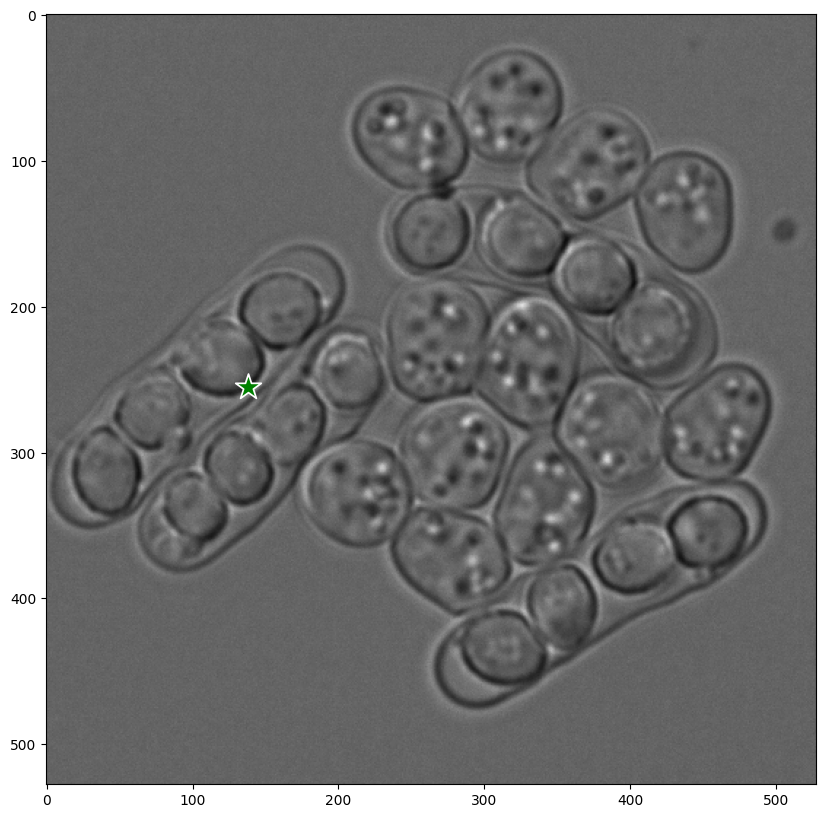

In [205]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

Predict with `SamPredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [206]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

With `multimask_output=True` (the default setting), SAM outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [207]:
masks.shape  # (number_of_masks) x H x W

(3, 528, 528)

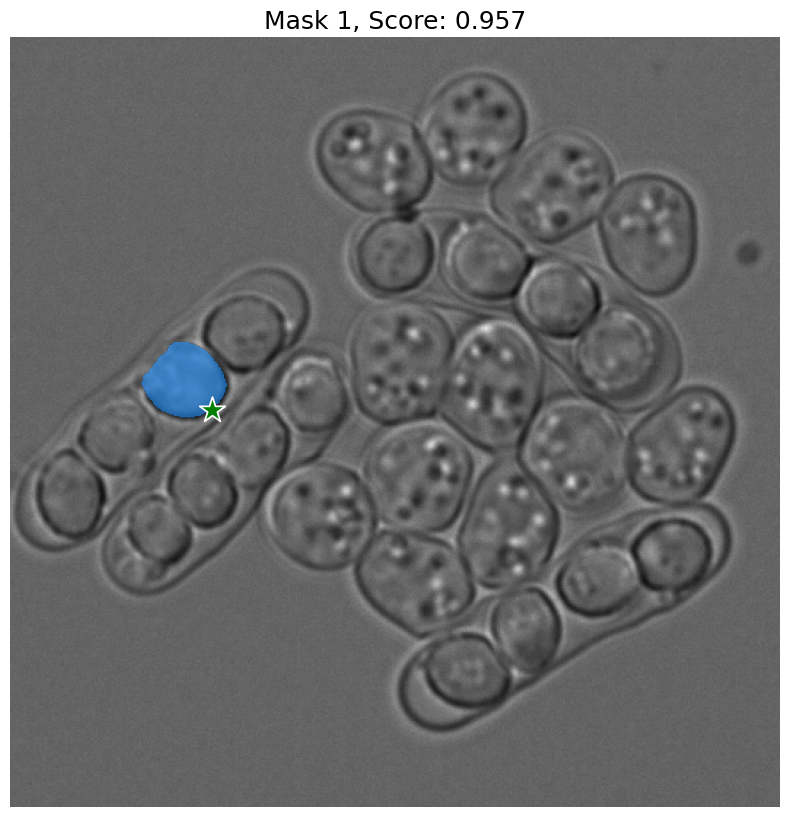

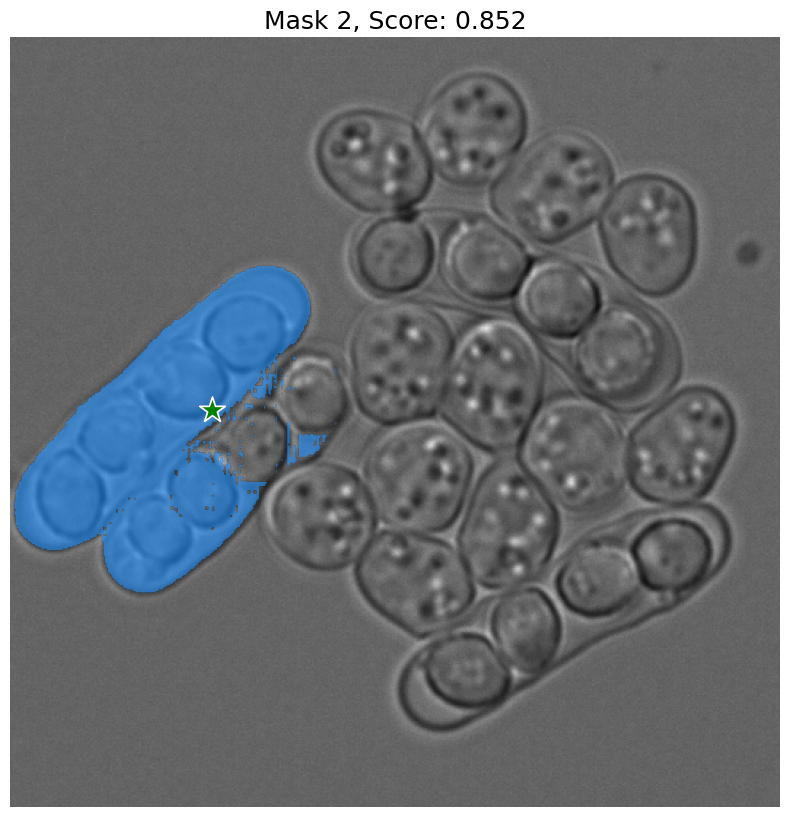

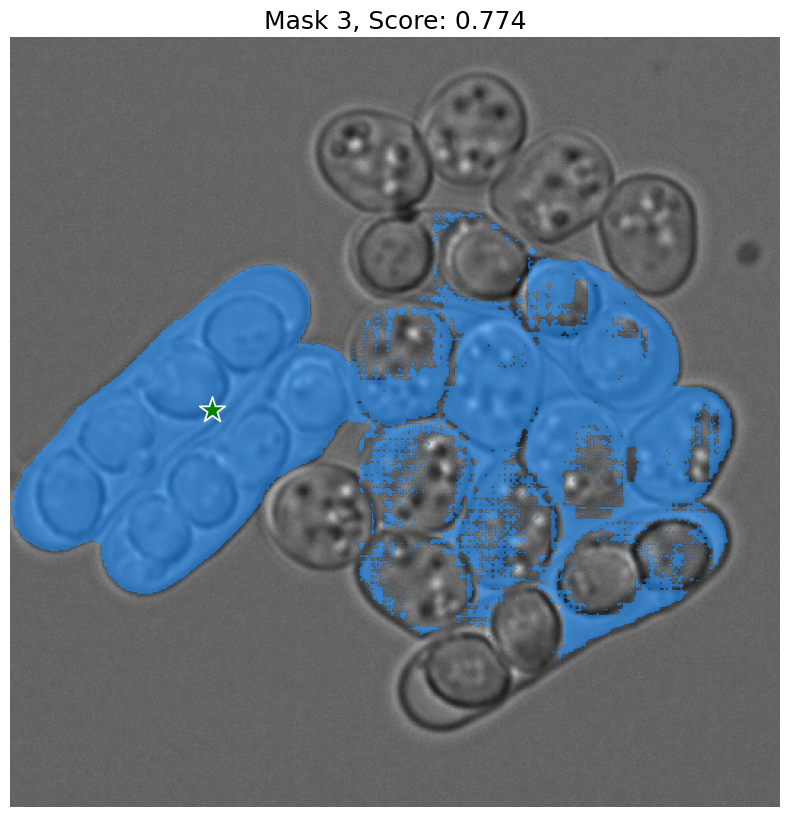

In [208]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  
  

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [127]:
input_point = np.array([[100, 350], [200, 230]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [128]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=True,
)

In [129]:
masks.shape

(3, 528, 528)

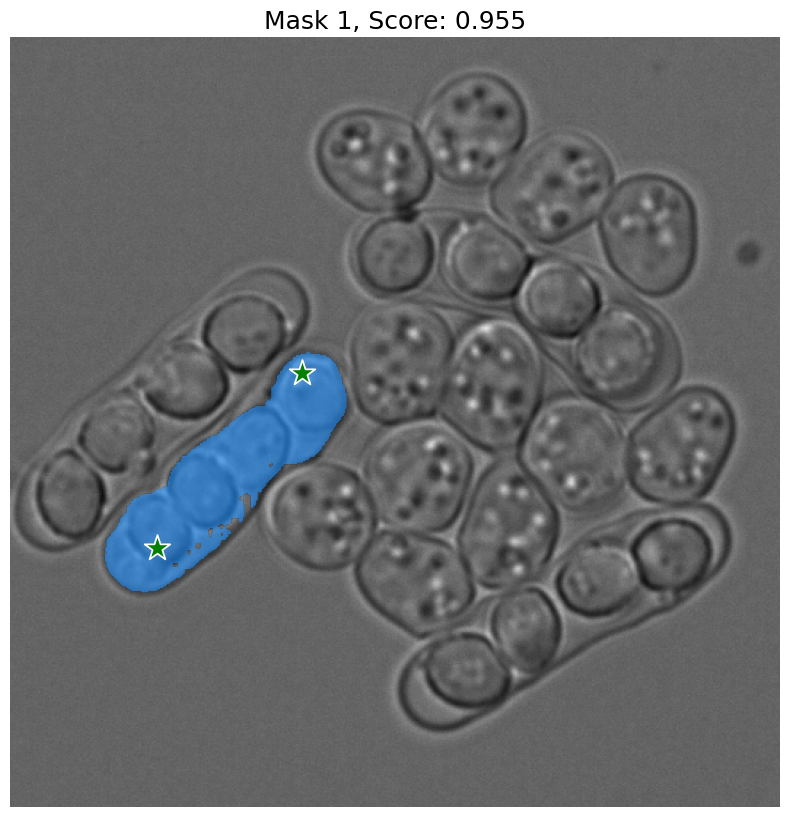

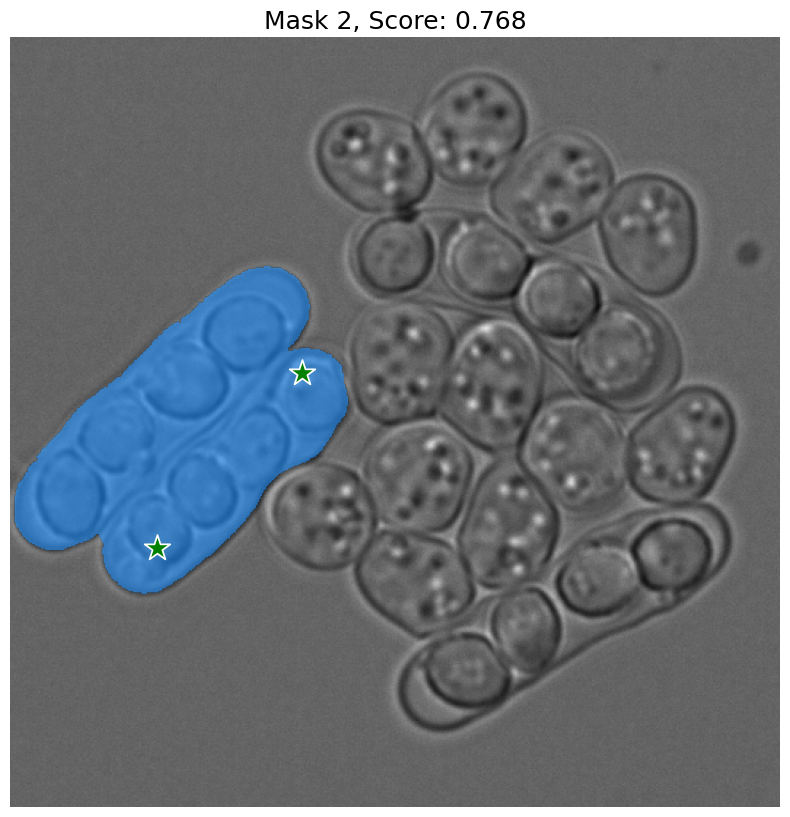

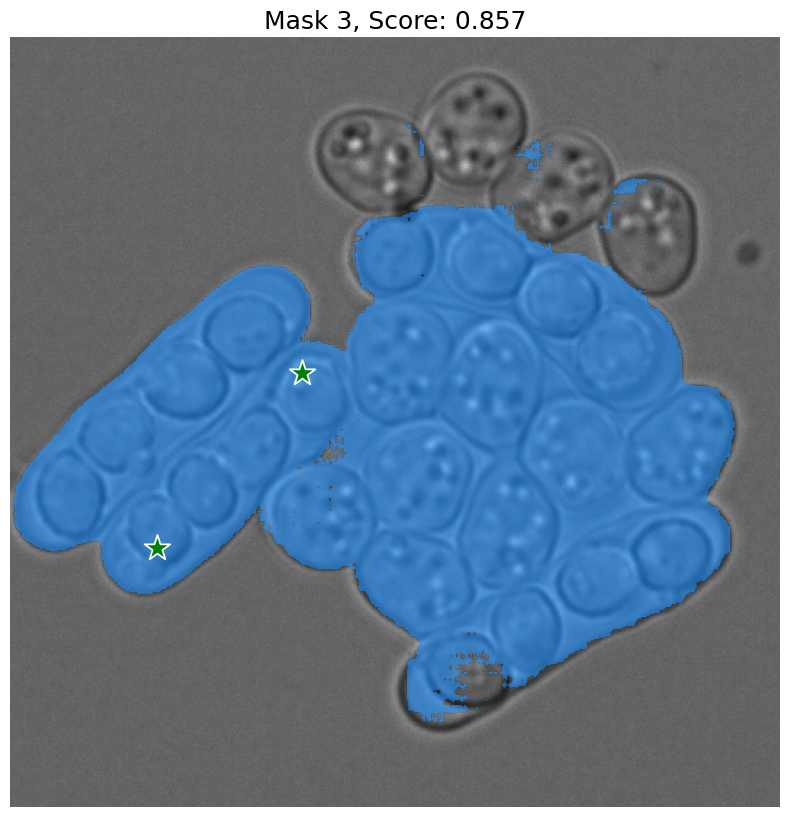

In [130]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.savefig("/home/wlli/Pictures/include"+str(i)+".png")
    plt.show()
  

ValueError: cannot reshape array of size 836352 into shape (528,528,1)

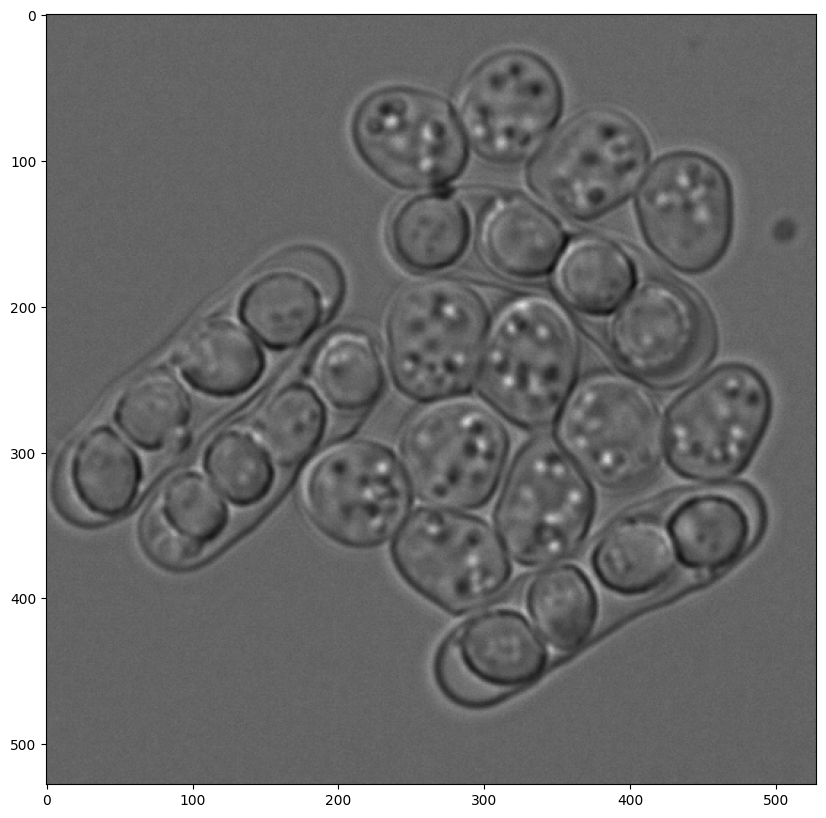

In [92]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [200]:
input_point = np.array([[100, 350], [200, 230], [110, 270]])
input_label = np.array([1,1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [201]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=True,
)

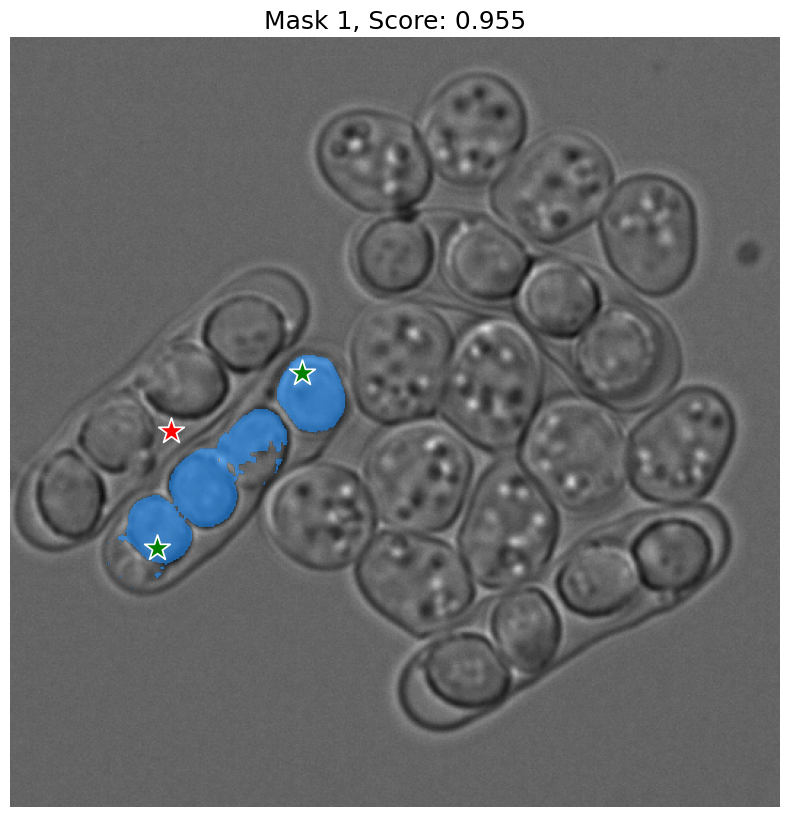

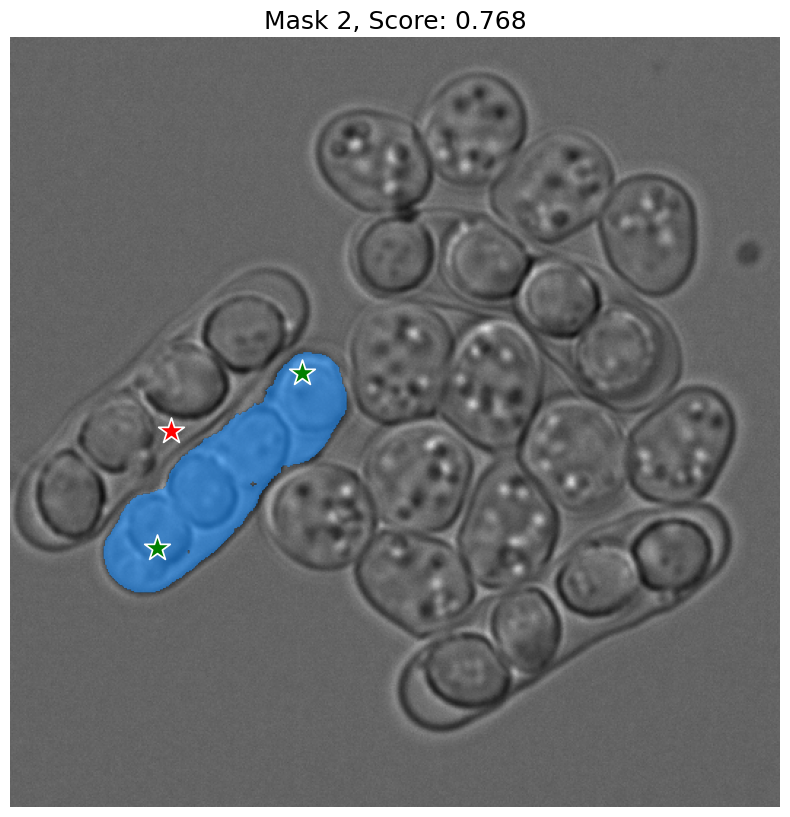

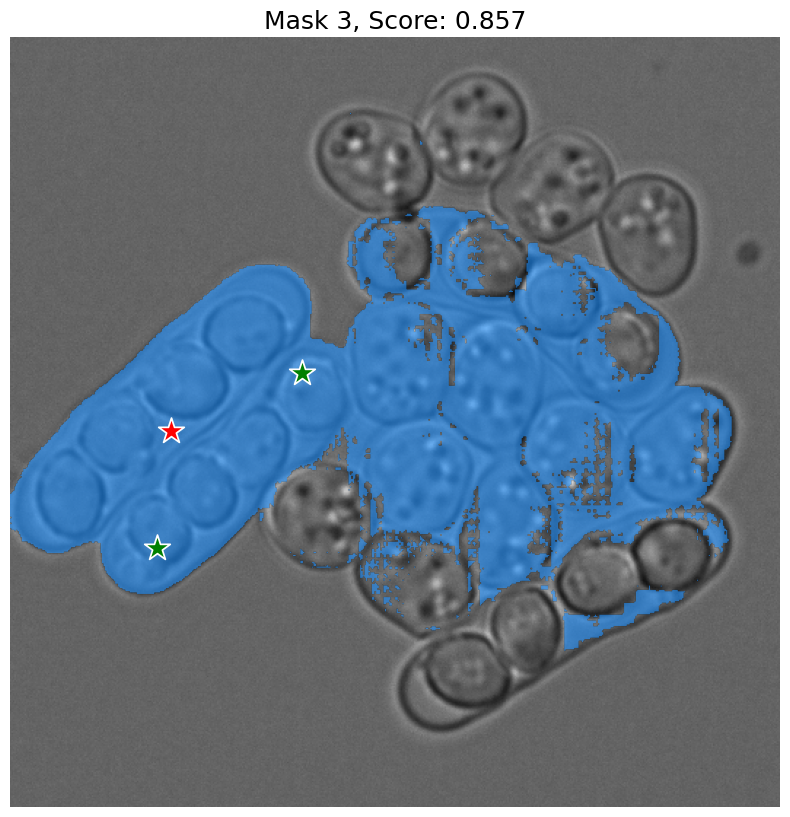

In [202]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.savefig("/home/wlli/Pictures/exclude"+str(i)+".png")
    plt.show()
  

ValueError: cannot reshape array of size 836352 into shape (528,528,1)

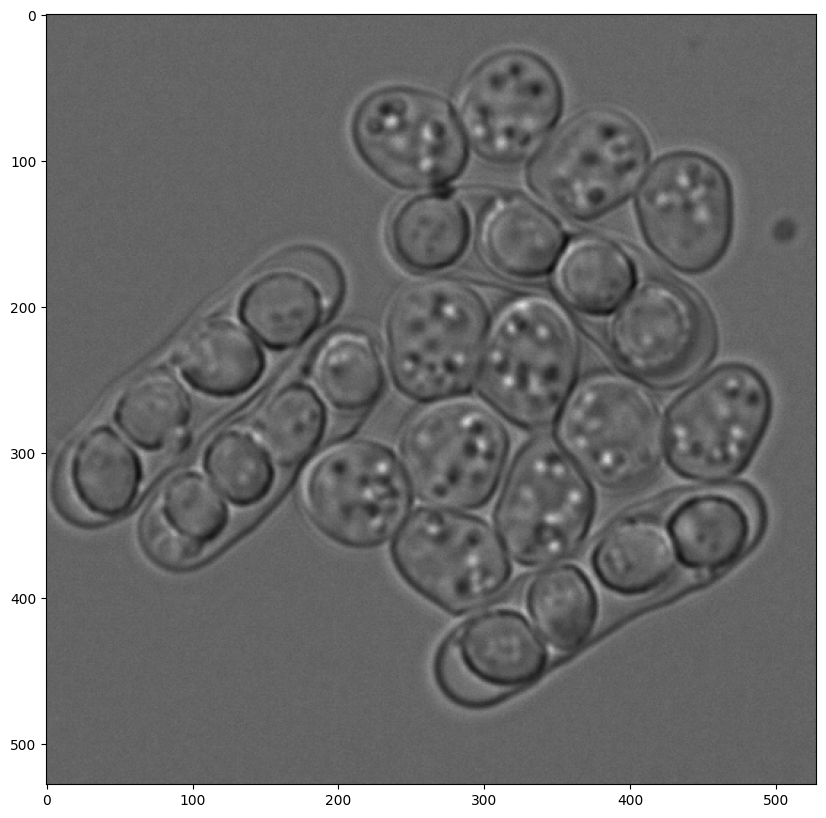

In [181]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [121]:
input_box = np.array([425, 600, 700, 875])

In [122]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

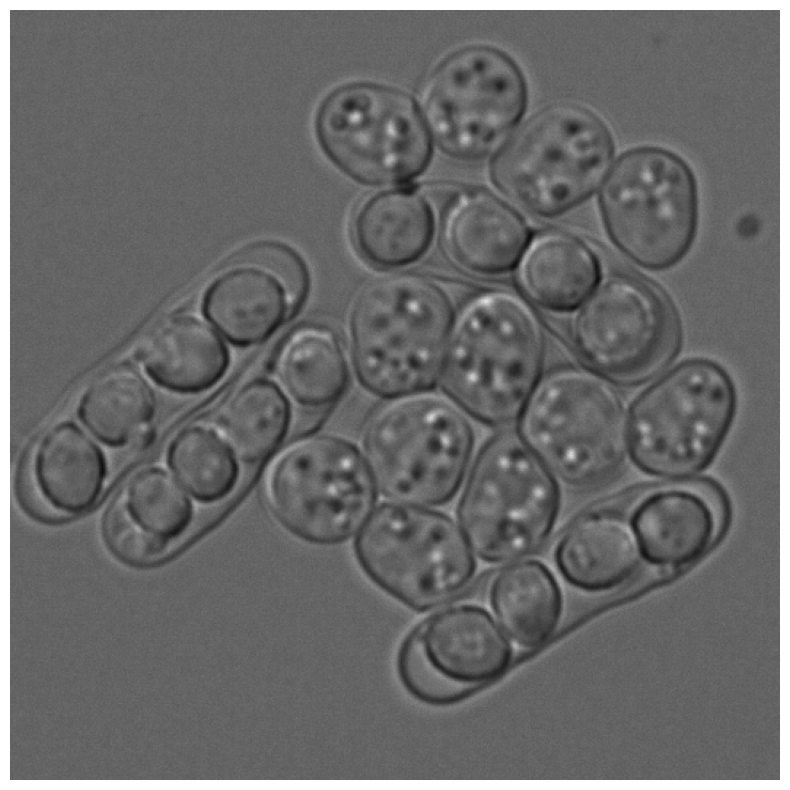

In [123]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [23]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [24]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

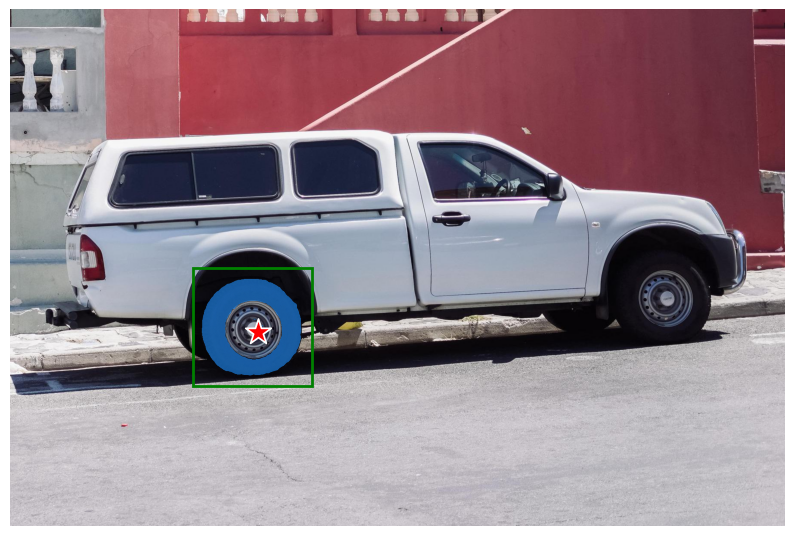

In [25]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## Batched prompt inputs

SamPredictor can take multiple input prompts for the same image, using `predict_torch` method. This method assumes input points are already torch tensors and have already been transformed to the input frame. For example, imagine we have several box outputs from an object detector.

In [26]:
input_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=predictor.device)

Transform the boxes to the input frame, then predict masks. `SamPredictor` stores the necessary transform as the `transform` field for easy access, though it can also be instantiated directly for use in e.g. a dataloader (see `segment_anything.utils.transforms`).

In [27]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [28]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([4, 1, 1200, 1800])

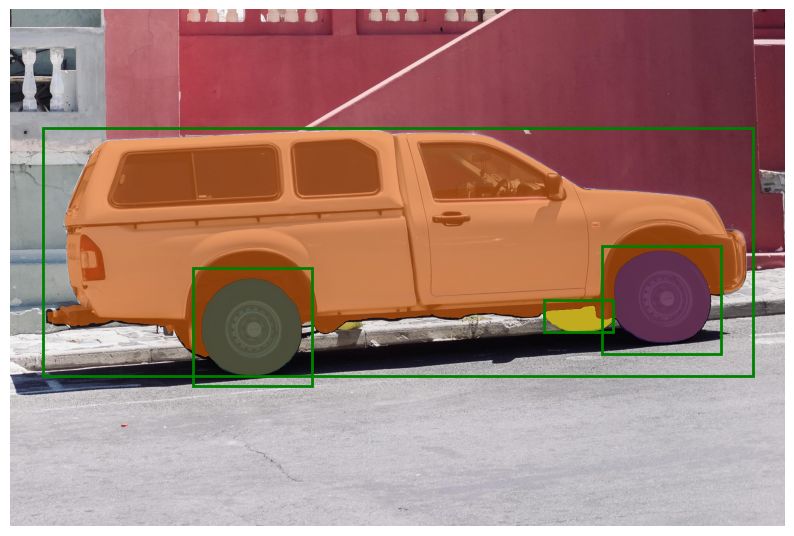

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference

If all prompts are available in advance, it is possible to run SAM directly in an end-to-end fashion. This also allows batching over images.

In [30]:
image1 = image  # truck.jpg from above
image1_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=sam.device)

image2 = cv2.imread('images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = torch.tensor([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
], device=sam.device)

Both images and prompts are input as PyTorch tensors that are already transformed to the correct frame. Inputs are packaged as a list over images, which each element is a dict that takes the following keys:
* `image`: The input image as a PyTorch tensor in CHW format.
* `original_size`: The size of the image before transforming for input to SAM, in (H, W) format.
* `point_coords`: Batched coordinates of point prompts.
* `point_labels`: Batched labels of point prompts.
* `boxes`: Batched input boxes.
* `mask_inputs`: Batched input masks.

If a prompt is not present, the key can be excluded.

In [31]:
from segment_anything.utils.transforms import ResizeLongestSide
resize_transform = ResizeLongestSide(sam.image_encoder.img_size)

def prepare_image(image, transform, device):
    image = transform.apply_image(image)
    image = torch.as_tensor(image, device=device.device) 
    return image.permute(2, 0, 1).contiguous()

In [32]:
batched_input = [
     {
         'image': prepare_image(image1, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image1_boxes, image1.shape[:2]),
         'original_size': image1.shape[:2]
     },
     {
         'image': prepare_image(image2, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image2_boxes, image2.shape[:2]),
         'original_size': image2.shape[:2]
     }
]

Run the model.

In [33]:
batched_output = sam(batched_input, multimask_output=False)

The output is a list over results for each input image, where list elements are dictionaries with the following keys:
* `masks`: A batched torch tensor of predicted binary masks, the size of the original image.
* `iou_predictions`: The model's prediction of the quality for each mask.
* `low_res_logits`: Low res logits for each mask, which can be passed back to the model as mask input on a later iteration.

In [34]:
batched_output[0].keys()

dict_keys(['masks', 'iou_predictions', 'low_res_logits'])

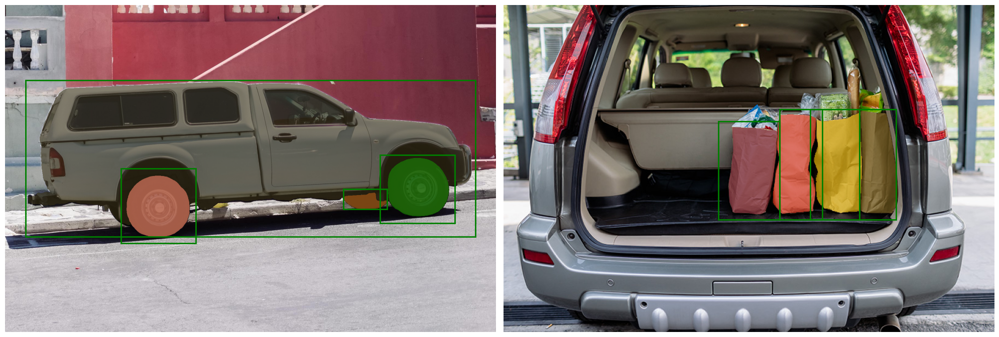

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
for mask in batched_output[0]['masks']:
    show_mask(mask.cpu().numpy(), ax[0], random_color=True)
for box in image1_boxes:
    show_box(box.cpu().numpy(), ax[0])
ax[0].axis('off')

ax[1].imshow(image2)
for mask in batched_output[1]['masks']:
    show_mask(mask.cpu().numpy(), ax[1], random_color=True)
for box in image2_boxes:
    show_box(box.cpu().numpy(), ax[1])
ax[1].axis('off')

plt.tight_layout()
plt.show()